In [1]:
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
K=8
death_ratio = np.array([0.00000000e+00, 3.36964689e-06, 2.19595034e-05, 4.49107573e-05,
               1.88422215e-04, 4.99762978e-04, 1.89895681e-03, 7.40632275e-03])

all_death = pd.read_csv("../data/orszagos_halott.csv", sep=',')[:755]
death_orig = np.array(all_death[181:181+180]["Hétnapos mozgóátlag"])

In [3]:
sett_types = pd.read_csv("../../../data/hun/HU_places_admin_pop_ZIP_latlon.csv",
           sep=',',
           header=0)

KSH = pd.read_csv("../../../data/hun/KSHCommuting_c1ID_c1name_c2ID_c2name_comm_school_work_DIR.csv",
           sep=',',
           header=0)

pops = sett_types.set_index("place").to_dict()["population"]
pops_code = sett_types.set_index("KSH code").to_dict()["population"]

In [13]:
def get_inf_curve(filename, death = None, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    I = np.sum(I, axis=2)
    I2 = np.sum(I2, axis=2)
    if type(death) != None:
        return np.sum(I*death, axis=1)+np.sum(I2*death, axis=1), Is.sum(axis=1), Is2.sum(axis=1)
    else:
        return Is.sum(axis=1), Is2.sum(axis=1)

def get_inf(filename, death = None, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    return I.sum(axis=1),I2.sum(axis=1)
    
def get_inf_curve2(filename, death_ratio, all_death, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    I = np.sum(I, axis=2)
    I2 = np.sum(I2, axis=2)
    if type(death) != None:
        return np.sum(I*death_ratio*(all_death/np.sum(I)), axis=1), Is.sum(axis=1), Is2.sum(axis=1)
    else:
        return Is.sum(axis=1), Is2.sum(axis=1)

def fit(x,y):
    min_ind = 0
    MIN = 1e12
    for shift in range(25):
        orig_shifted = x[shift:len(y)+25-(25-shift)]
        l2 = np.sqrt(np.sum((orig_shifted-y)**2))
        if l2 < MIN:
            MIN = l2
            min_ind = shift
    return min_ind, MIN


# District aggregation

### Original:

$$
w_{k,l} = \frac{\sum\limits_{i \in I_k} \sum\limits_{j \in I_l} w_{i,j} n_i n_j}{m_k m_l}
$$

### New:
$$
\hat{w}_{k,l} = \frac{\sum\limits_{i \in I_k} \sum\limits_{j \in I_l} w_{i,j}\phi_j n_i n_j}{m_k \sum\limits_{j \in I_l}\phi_j n_j}
$$

City has 10.69% less total infections
City has 9.18% less total infections
City has 1.00% less total infections
City has -4.35% less total infections
City has 2.06% less total infections
City has -1.69% less total infections


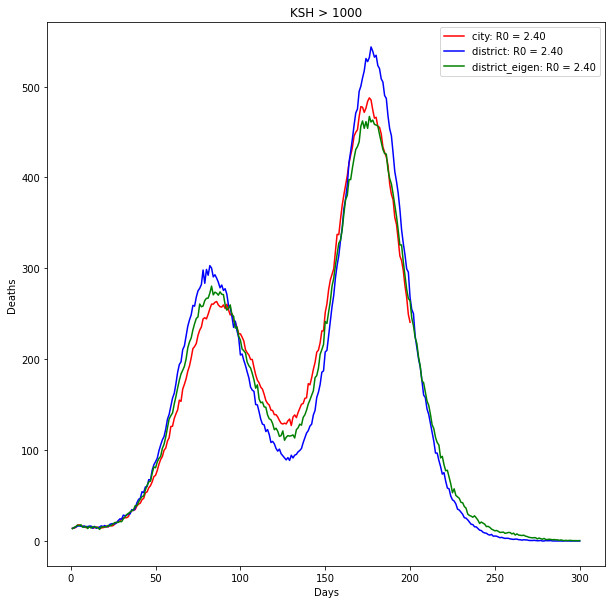

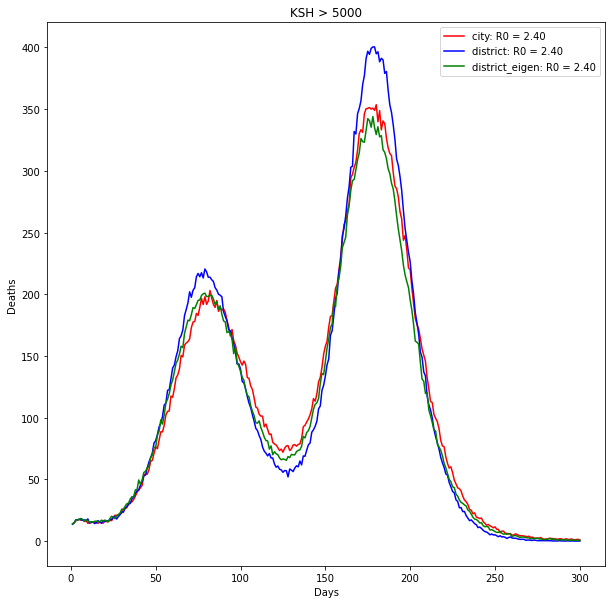

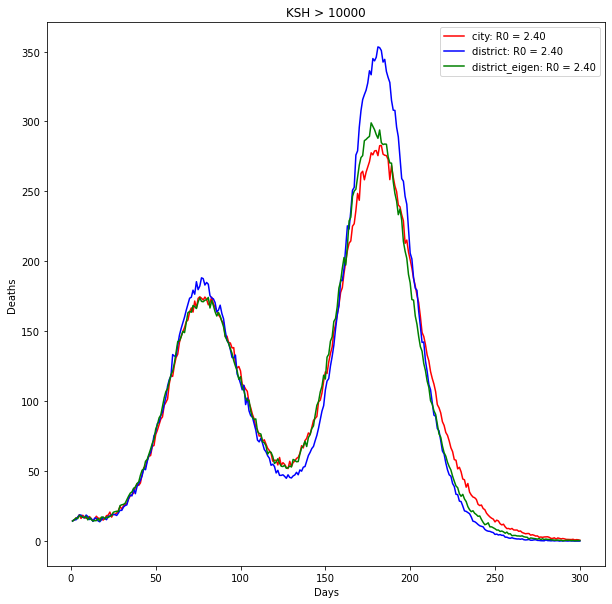

In [5]:
for th in [1000, 5000, 10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        x = np.array(list(range(1, len(death_d2)+1)))
        plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

City has 10.69% less total infections
City has 9.18% less total infections
City has 1.00% less total infections
City has -4.35% less total infections
City has 2.06% less total infections
City has -1.69% less total infections


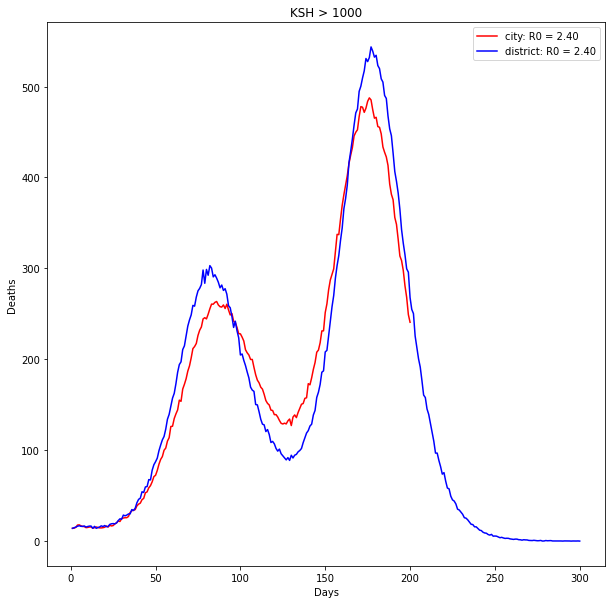

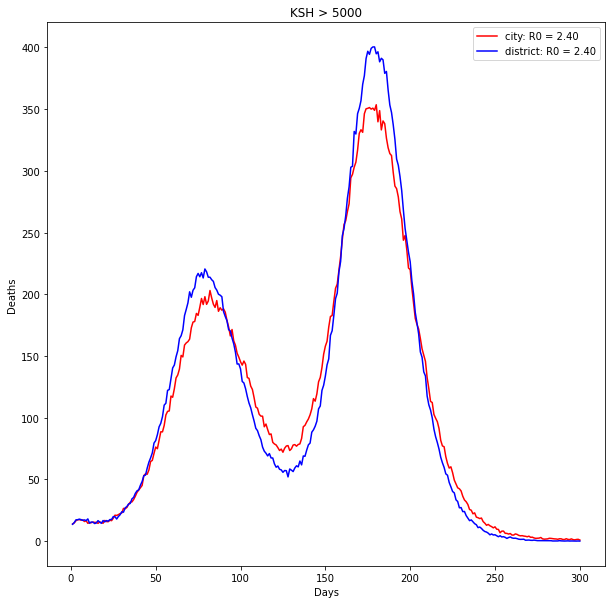

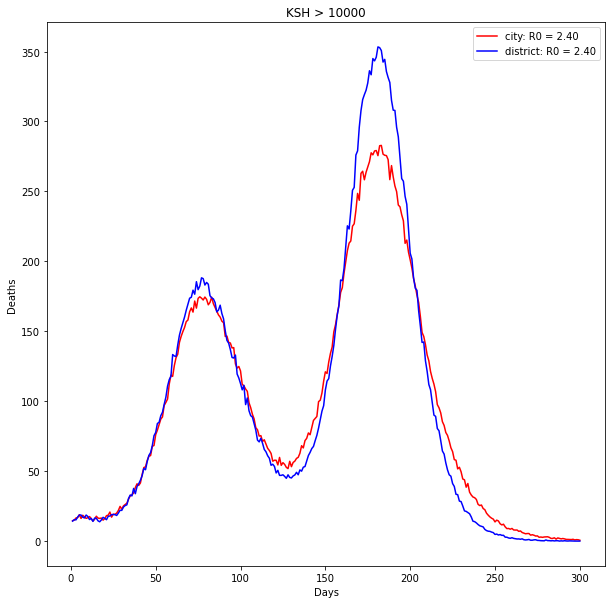

In [6]:
for th in [1000, 5000, 10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        #x = np.array(list(range(1, len(death_d2)+1)))
        #plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

In [7]:
phis = []
cities = []
for th in [1000,5000,10000]:
    with open(f'../../input/hun_{th}/{th}.npy', 'rb') as f:
        phi_act = np.load(f)
    with open(f'../../input/hun_{th}/{th}_cities.npy', 'rb') as f:
        cities_act = np.load(f)
    cities.append(cities_act)
    phis.append(phi_act)

phi_1000,phi_5000,phi_10000 = phis
cities_1000,cities_5000,cities_10000 = cities

In [8]:

d_1000 = {city:p for city,p in zip(cities_1000, phi_1000)}
d_1000["Budapest"]=np.mean([d_1000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

d_5000 = {city:p for city,p in zip(cities_5000, phi_5000)}
d_5000["Budapest"]=np.mean([d_5000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

d_10000 = {city:p for city,p in zip(cities_10000, phi_10000)}
d_10000["Budapest"]=np.mean([d_10000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

print(len(d_5000), len(d_10000))

295 168


# Correlation (largest eigenvector, the spacial distribution of the inf.)

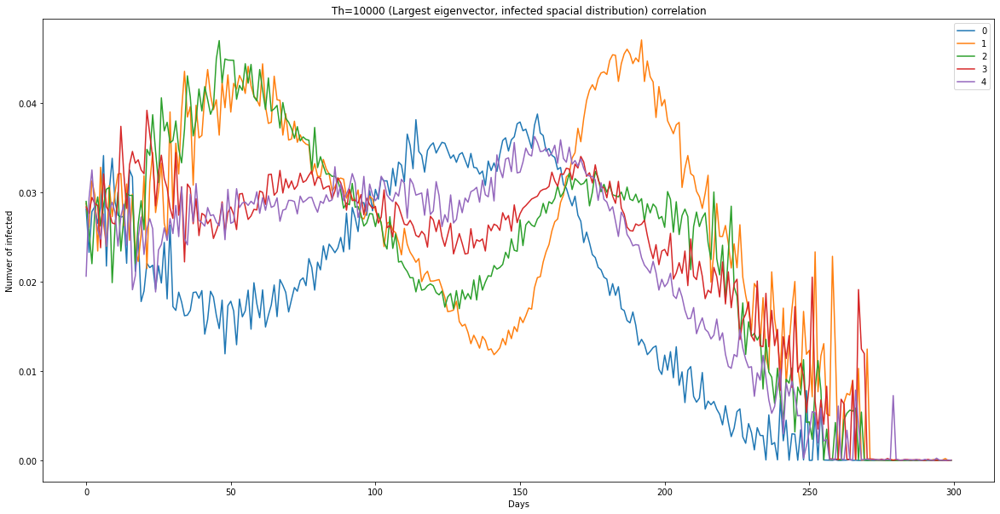

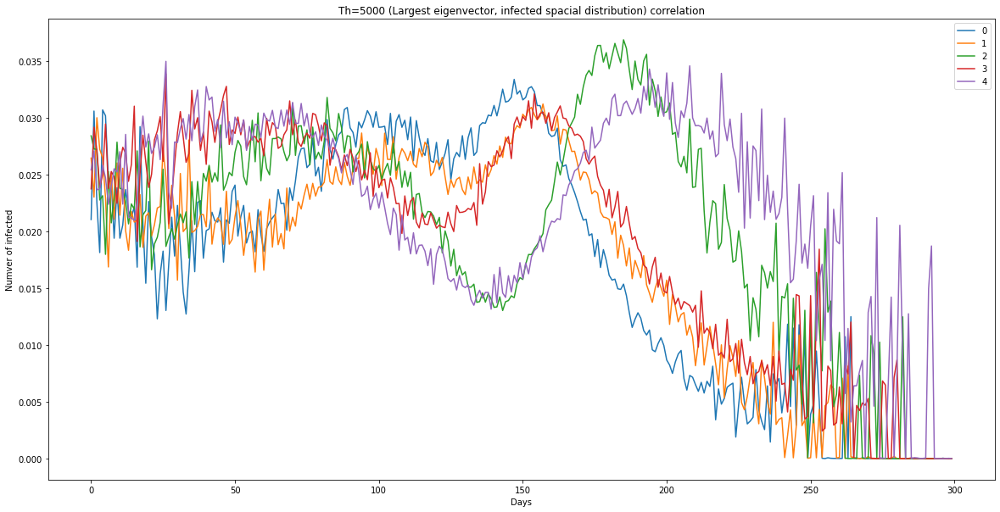

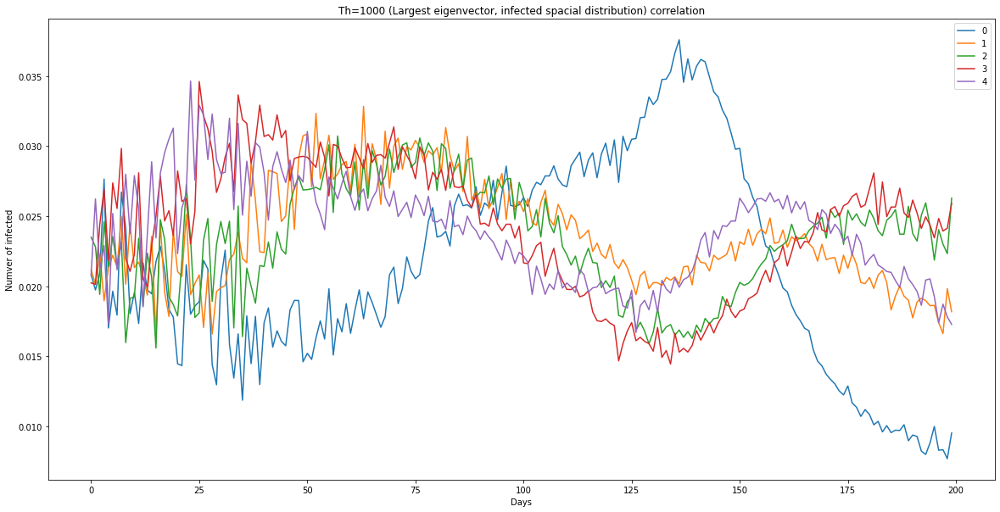

In [78]:
for th,phi in [(10000,phi_10000),(5000,phi_5000),(1000,phi_1000)]:
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    for model in [city]:
        plt.figure(figsize=(20,10))
        I_all = []
        for i in range(10):
            I, I2 = get_inf(f"../../output/{model}/{i}.txt", death = death_ratio*10)

            I_all = I+I2 if (len(I_all)==0) else I_all+I+I2
            if i<5:
                plt.plot([np.correlate((I+I2)[i]/np.sum((I+I2)[i]), phi) for i in range(len(I_all))], label=f"{i}", alpha=1.0)


        #plt.plot([np.correlate((I_all)[i]/np.sum((I_all)[i]), phi) for i in range(len(I_all))], label="All")
        plt.xlabel("Days")
        plt.ylabel("Numver of infected")
        plt.title(f"Th={th} (Largest eigenvector, infected spacial distribution) correlation")
        plt.legend()
        plt.show()

(300, 111)


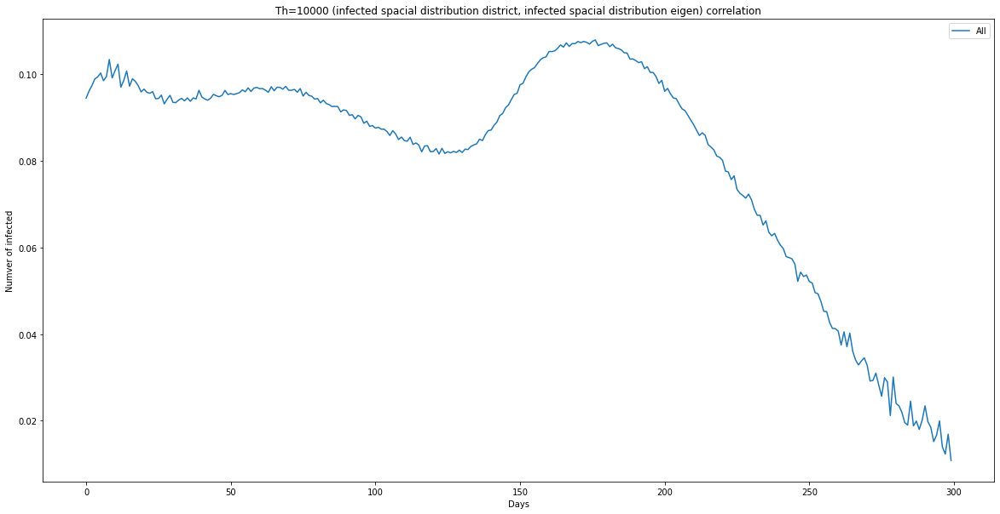

(300, 147)


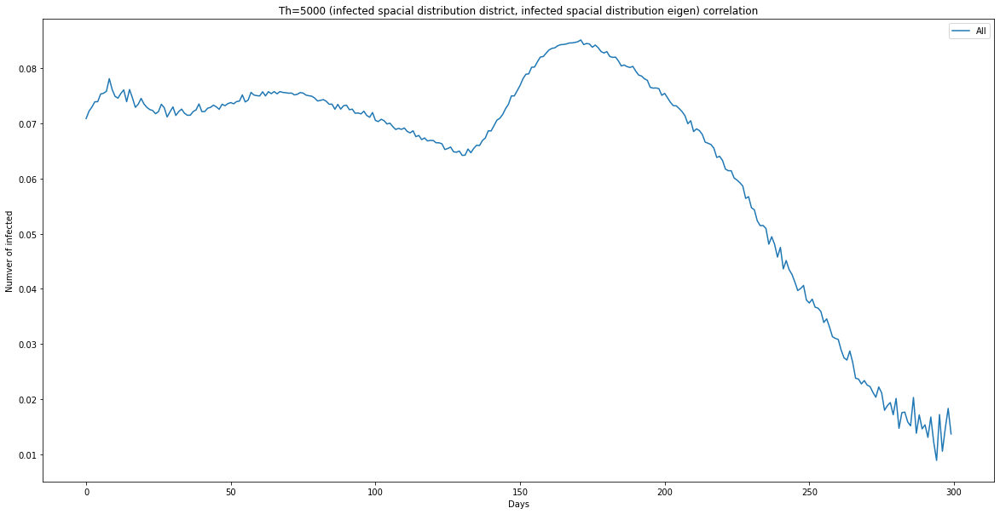

(300, 175)


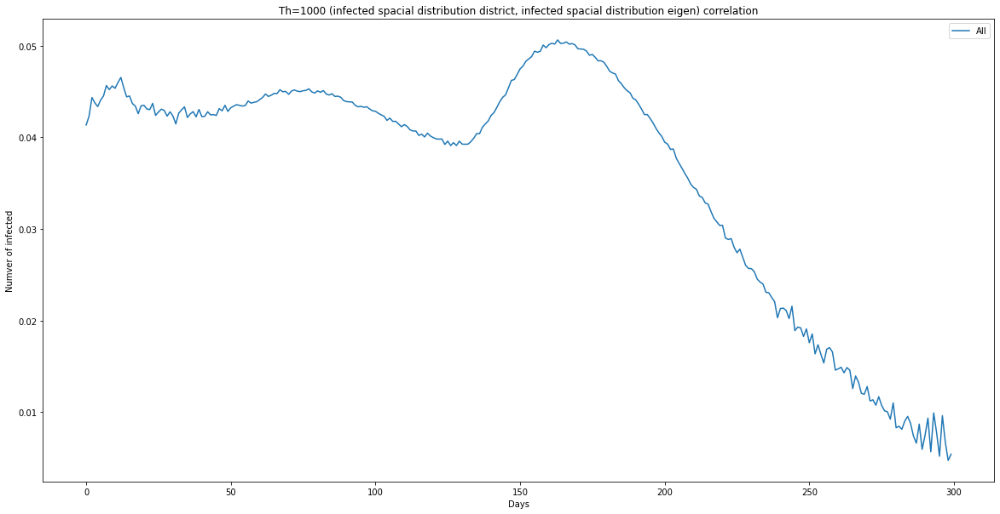

In [76]:
for th,phi in [(10000,phi_10000),(5000,phi_5000),(1000,phi_1000)]:
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    for model in [city]:
        plt.figure(figsize=(20,10))
        I_all = []
        I_all_ = []
        for i in range(10):
            I, I2 = get_inf(f"../../output/{district}/{i}.txt", death = death_ratio*10)
            I_, I2_ = get_inf(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

            I_all = I+I2 if (len(I_all)==0) else I_all+I+I2
            I_all_ = I_+I2_ if (len(I_all_)==0) else I_all_+I_+I2_
            
        print(I_all.shape)
        plt.plot([np.correlate((I_all)[i]/np.sum((I_all)[i]), (I_all_)[i]/np.sum((I_all_)[i])) for i in range(len(I_all))], label="All")
        plt.xlabel("Days")
        plt.ylabel("Numver of infected")
        plt.title(f"Th={th} (infected spacial distribution district, infected spacial distribution eigen) correlation")
        plt.legend()
        plt.show()

# Confidence interval (95%)

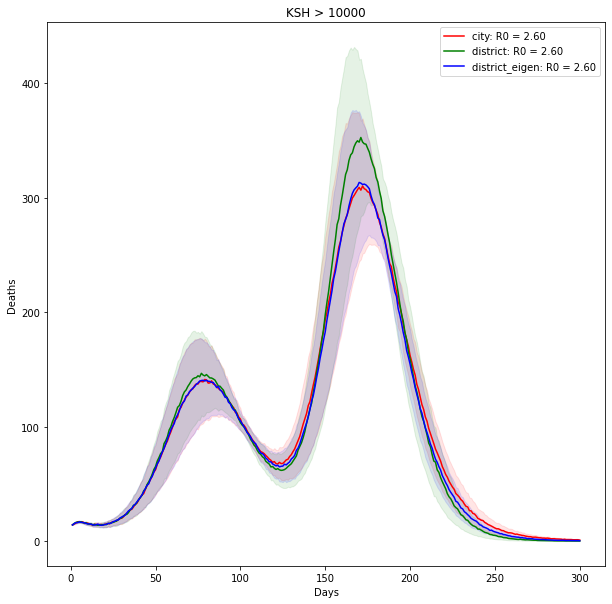

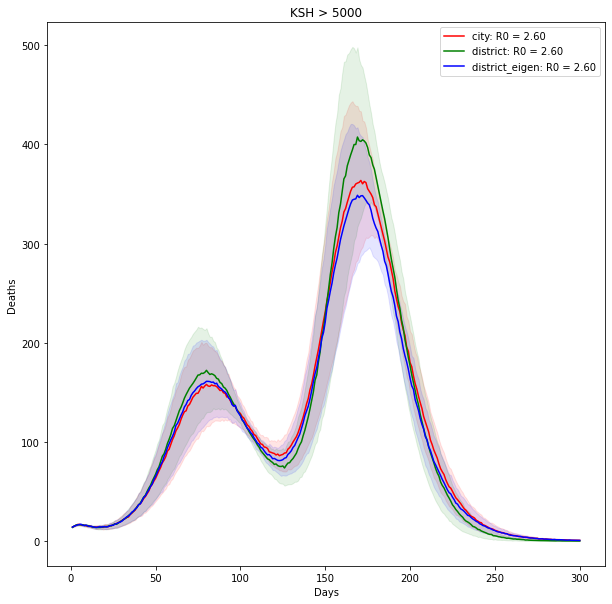

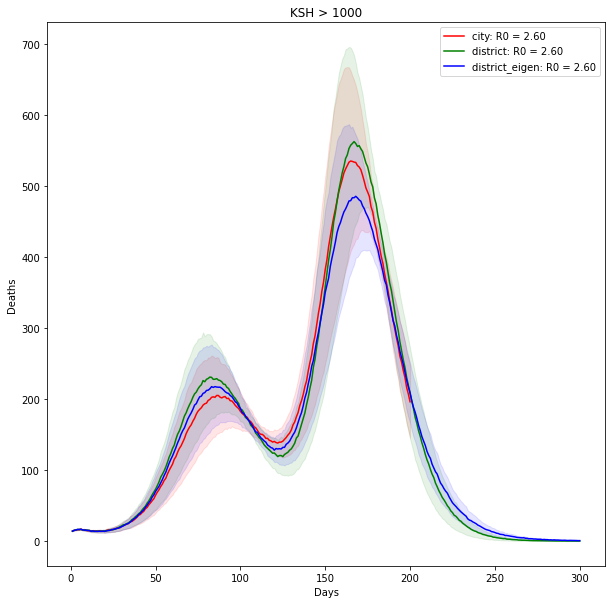

In [72]:
for th in [10000, 5000, 1000]:
#for th in [10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    death_all0 = []
    death_all1 = []
    death_all2 = []
    for i in range(10):
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)
        
        death_all0.append(death)
        death_all1.append(death_d)
        death_all2.append(death_d2)
    
    for death_all,c,label in zip([death_all0, death_all1, death_all2],['r','g','b'],['city','district','district_eigen']):
        x = np.array(list(range(1, len(death_all[0])+1)))
        y = np.mean(death_all, axis=0)
        std = np.std(death_all, axis=0)
        ci = 1.96 * np.std(death_all, axis=0)/np.sqrt(len(death_all))
        plt.plot(x, y, label=f"{label}: R0 = {R0[i]:.2f}", c=c)
        plt.fill_between(x, y-ci, y+ci, color=c, alpha=0.1)
    
    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

In [33]:
(I+I2)[0].shape, phi_10000.shape

((167,), (167,))

In [35]:
np.correlate((I+I2)[0], phi_10000)

array([115.98200237])

In [42]:
np.sum(phi_10000)

1.0

In [9]:
d_1000

{'Aba': 8.037723231473149e-09,
 'Abádszalók': 1.3158216191840931e-08,
 'Abasár': 7.007148885989288e-09,
 'Abaújszántó': 1.882364148552608e-08,
 'Abda': 1.6989077470186985e-10,
 'Abony': 1.3468424382206368e-07,
 'Ács': 1.2639376534466714e-08,
 'Acsa': 6.929478507003525e-11,
 'Adács': 3.780361034384786e-09,
 'Ádánd': 2.782849197374882e-10,
 'Adony': 7.276455610780427e-09,
 'Ágasegyháza': 2.132016580158254e-09,
 'Ágfalva': 1.2041510023156035e-09,
 'Ajak': 1.2869809165370639e-08,
 'Ajka': 2.7884974878508797e-06,
 'Akasztó': 3.2943344434157047e-09,
 'Alap': 1.2726193857917072e-10,
 'Alattyán': 2.255727604928149e-09,
 'Albertirsa': 9.519024726621851e-08,
 'Alcsútdoboz': 1.4576208520353048e-09,
 'Algyő': -0.0,
 'Almásfüzitő': -0.0,
 'Álmosd': 1.0239241918135388e-06,
 'Alsónémedi': 1.2947203873214075e-06,
 'Alsóörs': 1.6461337528208171e-09,
 'Alsópáhok': 1.2011085300328053e-10,
 'Alsószentmárton': 4.1740286917735807e-10,
 'Alsóvadász': 8.889982500694486e-09,
 'Alsózsolca': 1.79041587757164e-06

In [30]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_5000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_5000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>5000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

In [31]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_1000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_1000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>1000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

Text(0, 0.5, 'Eigenvector value')

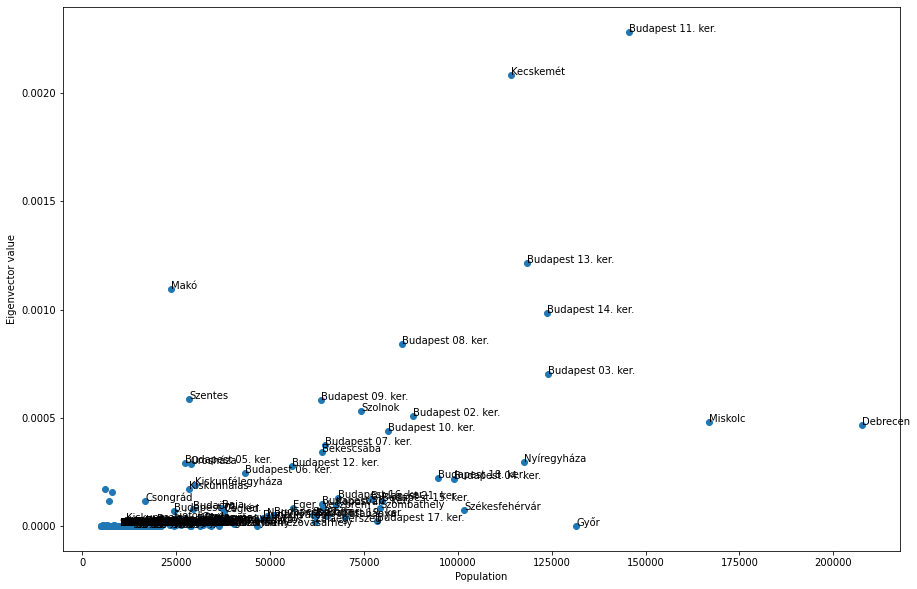

In [26]:
cities = [city for city in d_5000 if city not in ["Budapest", "Szeged", "Pécs"]]

plt.figure(figsize=(15,10))
X = [pops[city] for city in cities]
Y = [d_5000[city] for city in cities]
plt.scatter(X, Y)

#print(X,Y)
for i, city in enumerate(cities):
    if(X[i]>10000):
        plt.annotate(city, (X[i], Y[i]))

#plt.xscale("log")
#plt.yscale("log")
plt.xlabel("Population")
plt.ylabel("Eigenvector value")

Text(0, 0.5, 'Eigenvector value')

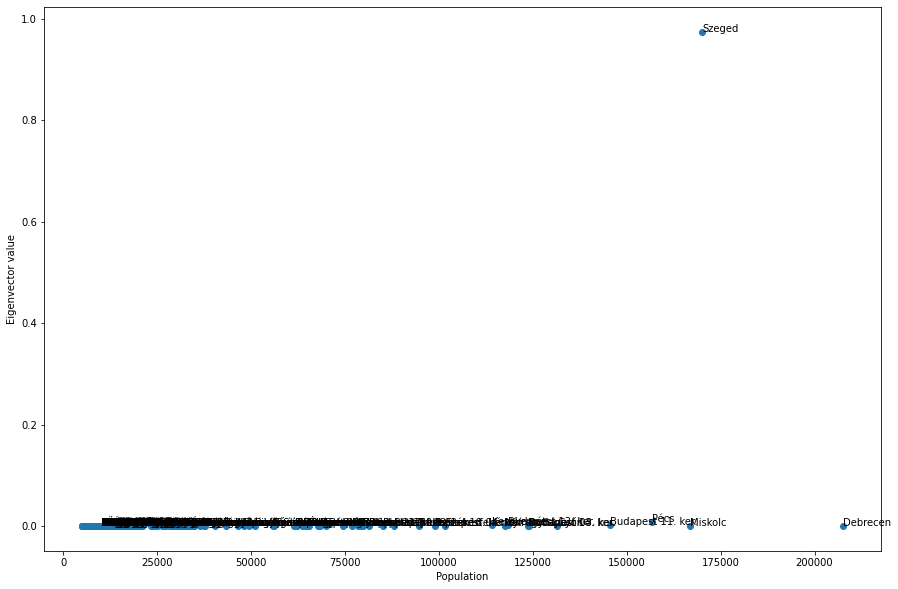

In [87]:
cities = [city for city in d_5000 if city not in ["Budapest"]]

plt.figure(figsize=(15,10))
X = [pops[city] for city in cities]
Y = [d_5000[city] for city in cities]
plt.scatter(X, Y)

#print(X,Y)
for i, city in enumerate(cities):
    if(X[i]>10000):
        plt.annotate(city, (X[i], Y[i]))

#plt.xscale("log")
#plt.yscale("log")
plt.xlabel("Population")
plt.ylabel("Eigenvector value")

In [63]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_10000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_10000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>10000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m